# Analiza metod segmentacji obrazów dermatoskopowych

Projekt został zrealizowany w ramach przedmiotu *Projekt indywidualny* na kierunku Informatyka Stosowana, prowadzonym na Politechnice Warszawskiej.

Autor: Mateusz Ciurzyński

Rozpoczęcie: 5.03.2025

Zakończenie: 7.06.2025

## Wstęp


Celem tego projektu jest analiza najpopularniejszych metod segmentacji semantycznej. Segmentacji będą poddane obrazy dermatoskopowe, a poprawność wyniku została określona przy pomocy współczynnika IoU, przeliczonego względem prawdziwej maski. Analizie zostaną poddane metody progowania oraz uczenia głębokiego, wraz z wariantami.

Pierwotnie metody progowania analizowałem przy użyciu biblioteki Scikit-Image, jednakże ze względu na fakt że jest ona napisana głównie z użyciem języka Python, analiza zajmowała bardzo dużo czasu. Znacznie wydajniejsza okazała się biblioteka Open-CV która jest głównie napisana w języku C++.

Do porównania metod segmentacji wykorzystałem miarę IoU (Intersection over Union), której wartość mieści się w przedziale ⟨0, 1⟩. Im wyższy wynik, tym większa zgodność wygenerowanej maski z maską referencyjną. W celu porównania metod na zbiorze zdjęć wyznaczam wskaźnik IoU dla każdego obrazu i uśredniam go.
$$
\text{IoU} = \frac{|A \cap B|}{|A \cup B|}
$$
- A - prawdziwa maska
- B - przewidywana maska

Metody są analizowane na podstawie zbioru zdjęć z konkursu [ISIC 2018](https://challenge.isic-archive.com/data/#2018).

## Wybrane metody
Skupiłem się na metodach progowania oraz na metodach wykorzystujących uczenie głębokie.

Spis metod:
- Metody progowania
  - [Algorytm Otsu](#algorytm-otsu)
  - [Algorytm Otsu z filtrami](#algorytm-otsu-z-filtrami)
  - [Progowanie lokalne](#progowanie-lokalne)
  - [Progowanie średniej](#progowanie-sredniej)
- Metody progowania z detekcją obramowania dermatoskopu
  - [Algorytm Otsu](#algorytm-otsu-z-detekcja-krawedzi)
  - [Algorytm Otsu z filtrami](#algorytm-otsu-z-filtrami-i-z-detekcja-krawedzi)
  - [Progowanie średniej](#progowanie-sredniej-z-detekcja-krawedzi)
- Uczenie głębokie
  - [Perceptron wielowarstwowy](#perceptron)
  - [Sieć U-Net](#unet)

## Przygotowanie środowiska 

### Import pakietów

In [64]:
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

import matplotlib.pyplot as plt
import matplotlib.patches as pat
import matplotlib.gridspec as gridspec

import cv2
import random
import os
import json
from itertools import product
from concurrent.futures import ThreadPoolExecutor
from tqdm import tqdm

pd.options.display.float_format = "{:.4f}".format

### Ścieżki do folderów z danymi

In [65]:
train_images_path = 'data/ISIC2018_Task1-2_Training_Input'
train_masks_path = 'data/ISIC2018_Task1_Training_GroundTruth'
validate_images_path = 'data/ISIC2018_Task1-2_Validation_Input'
validate_masks_path = 'data/ISIC2018_Task1_Validation_GroundTruth'
test_images_path = 'data/ISIC2018_Task1-2_Test_Input'
test_masks_path = 'data/ISIC2018_Task1_Test_GroundTruth'

### Serie przechowujące wyniki IoU

In [66]:
methods_scores = pd.Series(dtype=float)
methods_border_detection_scores = pd.Series(dtype=float)

### Funkcje pomocniczne

In [67]:
def calculate_iou(mask_pred, mask_gt):
    # Metoda obliczająca IOU
    intersection = np.logical_and(mask_pred, mask_gt)
    union = np.logical_or(mask_pred, mask_gt)
    if np.sum(union) == 0:
        return 1.0 if np.sum(intersection) == 0 else 0.0
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score


def load_single_image(filepath, is_grayscale, scaling):
    flag = cv2.IMREAD_GRAYSCALE if is_grayscale else cv2.IMREAD_COLOR
    image = cv2.imread(filepath, flag)
    if image is not None and scaling is not None:
        image = cv2.resize(image, (scaling, scaling))
    return image

def load_images(path, is_grayscale=False, scaling=None, max_workers=8):
    image_paths = [
        os.path.join(path, file)
        for file in os.listdir(path)
        if file.endswith((".jpg", ".png"))
    ]

    images = []
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        results = executor.map(
            lambda fp: load_single_image(fp, is_grayscale, scaling), image_paths
        )
        images = list(results)

    return images

def get_image(image_pointer, is_grayscale=False):
    if isinstance(image_pointer, str):
        image = cv2.imread(image_pointer)
        if is_grayscale and image is not None:
            if len(image.shape) == 3:
                image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        return image
    elif isinstance(image_pointer, np.ndarray):
        return image_pointer
    else:
        print(type(image_pointer))
        raise ValueError('Invalid image type')


def set_up_images(images):
    # Metoda służąca do przygotowania listy zdjęć do analizy
    if isinstance(images, str):
        images_in_folder = os.listdir(images)
        images_pointer = [os.path.join(images, file) for file in images_in_folder]
    elif isinstance(images, list) or isinstance(images, tuple) or isinstance(images, np.ndarray):
        images_pointer = images
    else:
        raise ValueError('Invalid images type')
    return images_pointer

def plot_images(images_list, titles=None, row_titles=None, title=None, figsize=(15, 5)):
    rows = len(images_list)
    cols = len(images_list[0])

    fig = plt.figure(figsize=figsize, dpi=100, facecolor='lightgray')
    gs = gridspec.GridSpec(rows, cols + 1, width_ratios=[0.1] + [1] * cols, wspace=0.05, hspace=0.05)

    if title:
        fig.suptitle(title, fontsize=16, y=1.02)

    for row in range(rows):
        if row_titles is not None:
            ax_title = fig.add_subplot(gs[row, 0])
            ax_title.text(0.5, 0.5, row_titles[row], va='center', ha='center', rotation=0, fontsize=12)
            ax_title.axis('off')

        for col in range(cols):
            ax = fig.add_subplot(gs[row, col + 1])
            img = get_image(images_list[row][col])

            if img.ndim == 3:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                ax.imshow(img)
            else:
                ax.imshow(img, cmap='gray')

            ax.axis('off')

            if row == 0 and titles is not None:
                title_val = titles[col]
                if isinstance(title_val, float):
                    ax.set_title(f'{title_val:.4f}')
                else:
                    ax.set_title(str(title_val))

    plt.subplots_adjust(left=0.05, top=0.9)
    plt.show()


def process_image(method, image_pointer, ground_truth_pointer, params):
    # Funkcja wykonująca segmentacje przy użyciu wybranej metody
    image = get_image(image_pointer)
    ground_truth = get_image(ground_truth_pointer, is_grayscale=True)
    mask_pred = method(image, **params) if params else method(image)
    return calculate_iou(mask_pred, ground_truth)

def test_segmentation_method(method, images, ground_truths, minimal=False, params=None, k=5, threads=16):
    # Funkcja testująca metody segmentacji
    images_pointer = set_up_images(images)
    ground_truths_pointer = set_up_images(ground_truths)

    if len(images_pointer) != len(ground_truths_pointer):
        raise ValueError(
            'Number of images and ground truths must be equal. '
            f'Got {len(images_pointer)} images and {len(ground_truths_pointer)} ground truths.'
        )

    ious = pd.DataFrame(columns=['IoU'], index=range(len(images_pointer)), dtype=float)

    with ThreadPoolExecutor(max_workers=threads) as executor:
        results = list(executor.map(lambda args: process_image(method, *args, params), zip(images_pointer, ground_truths_pointer)))

    ious['IoU'] = results

    if not minimal:
        print(f'Wyniki metody: {ious.to_numpy().mean():.4f}')
        smallest_iou_indices = ious['IoU'].nsmallest(k).index
        largest_iou_indices = ious['IoU'].nlargest(k).index

        smallest_images = [images_pointer[idx] for idx in smallest_iou_indices]
        smallest_ground_truths = [ground_truths_pointer[idx] for idx in smallest_iou_indices]
        pred_masks_smallest = [method(get_image(images_pointer[idx])) for idx in smallest_iou_indices]

        plot_images(
            images_list=[smallest_images, smallest_ground_truths, pred_masks_smallest],
            titles=ious.iloc[smallest_iou_indices, 0].tolist(),
            row_titles=['Obraz', 'Ground truth', 'Predykcja'],
            title=f'Najniższy IoU',
            figsize=(5 * k, 9)
        )

        largest_images = [images_pointer[idx] for idx in largest_iou_indices]
        largest_ground_truths = [ground_truths_pointer[idx] for idx in largest_iou_indices]
        pred_masks_largest = [method(get_image(images_pointer[idx])) for idx in largest_iou_indices]

        plot_images(
            images_list=[largest_images, largest_ground_truths, pred_masks_largest],
            titles=ious.iloc[largest_iou_indices, 0].tolist(),
            row_titles=['Obraz', 'Ground truth', 'Predykcja'],
            title=f'Najwyższy IoU',
            figsize=(5 * k, 9)
        )

    return ious.to_numpy().mean()

def find_best_hyperparameters(method, images, ground_truths, params_grid, threads=16):
    best_params = None
    best_score = float('-inf')
    param_combinations = [dict(zip(params_grid.keys(), values)) for values in product(*params_grid.values())]

    for params in tqdm(param_combinations, desc="Searching hyperparameters"):
        score = test_segmentation_method(method, images, ground_truths, minimal=True, params=params, threads=threads)
        if score > best_score:
            best_score = score
            best_params = params

    return best_params, best_score

def save_or_load_best_hyperparameters(method_name, method, images, ground_truths, params_grid, threads=16):
    results_dir = "results"
    os.makedirs(results_dir, exist_ok=True)
    json_filename = os.path.join(results_dir, f"{method_name}_hyperparams.json")

    stored_results = {}
    if os.path.exists(json_filename):
        with open(json_filename, 'r') as f:
            stored_results = json.load(f)

    best_params = None
    best_score = float('-inf')
    param_combinations = [dict(zip(params_grid.keys(), values)) for values in product(*params_grid.values())]

    for params in tqdm(param_combinations, desc=f"Evaluating {method_name}"):
        params_key = json.dumps(params, sort_keys=True)
        if params_key in stored_results:
            score = stored_results[params_key]
        else:
            score = test_segmentation_method(method, images, ground_truths, params=params, threads=threads, minimal=True)
            stored_results[params_key] = score
            with open(json_filename, 'w') as f:
                json.dump(stored_results, f)

        if score > best_score:
            best_score = score
            best_params = params

    return best_params, best_score

def get_best_hyperparameters(method_name):
    # Metoda wyszukująca w pliku najlepsze hiperparametry
    results_dir = "results"
    json_filename = os.path.join(results_dir, f"{method_name}_hyperparams.json")

    if not os.path.exists(json_filename):
        return None, None

    with open(json_filename, 'r') as f:
        stored_results = json.load(f)

    if not stored_results:
        return None, None

    best_params = max(stored_results, key=stored_results.get)
    best_score = stored_results[best_params]

    best_params = json.loads(best_params)

    return best_params, best_score

## Analiza obrazów dermatoskopowych

Zbiór ISIC 2018 jest podzielony na zbiór treningowy, walidacyjny oraz testowy. Zbiór testowy zawiera 2594 obrazów,  walidacyjny 100 a  testowy 1000.

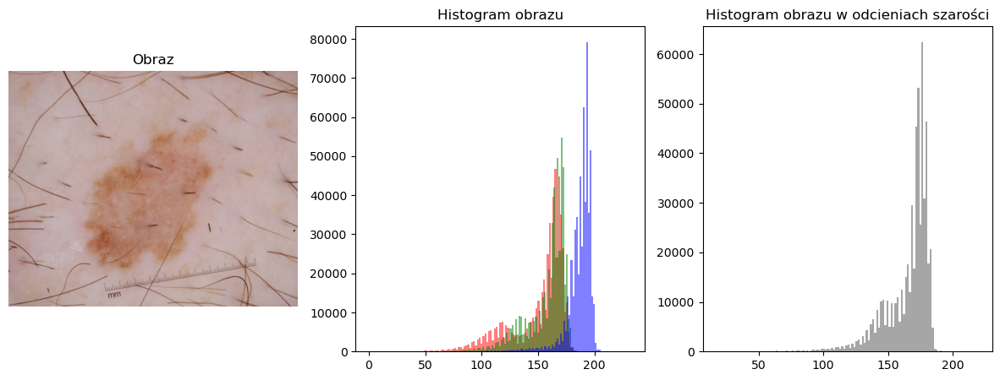

Dla obrazu: Min: 0, Max: 233
Rodzaj danych: uint8
Rozmiar: (680, 833, 3)
Ilość unikalnych wartości: 224


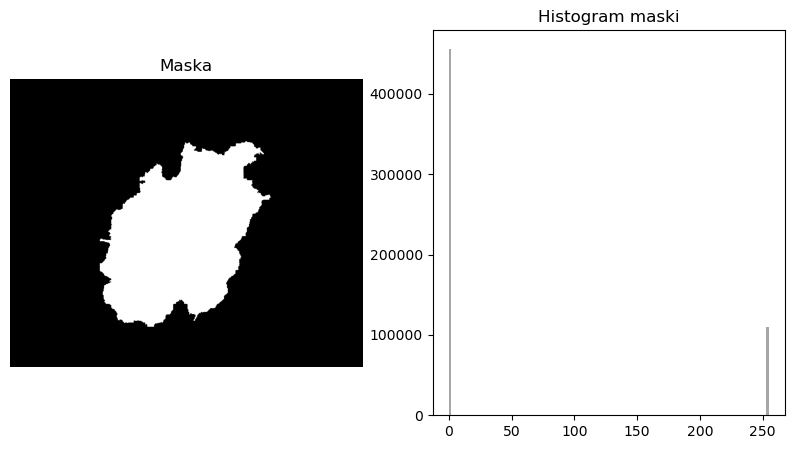

Dla maski: Min: 0, Max: 255
Rodzaj danych: uint8
Rozmiar: (680, 833)
Ilość unikalnych wartości: 2


In [26]:
image_files = [os.path.join(train_images_path, fname)
               for fname in os.listdir(train_images_path)
               if fname.lower().endswith(('.png', '.jpg'))]
mask_files = [os.path.join(train_masks_path, fname)
              for fname in os.listdir(train_masks_path)
              if fname.lower().endswith(('.png', '.jpg'))]

random.seed(42)
example_index = random.randrange(len(image_files))
example_image = cv2.imread(image_files[example_index])
example_mask = cv2.imread(mask_files[example_index], cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(example_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Obraz')
plt.subplot(1, 3, 2)
plt.hist(example_image[:,:,0].ravel(), bins=128, color='red', alpha=0.5)
plt.hist(example_image[:,:,1].ravel(), bins=128, color='green', alpha=0.5)
plt.hist(example_image[:,:,2].ravel(), bins=128, color='blue', alpha=0.5)
plt.title('Histogram obrazu')
plt.subplot(1, 3, 3)
gray_image = cv2.cvtColor(example_image, cv2.COLOR_BGR2GRAY)
plt.hist(gray_image.ravel(), bins=128, color='gray', alpha=0.7)
plt.title('Histogram obrazu w odcieniach szarości')
plt.show()

print(f"Dla obrazu: Min: {example_image.min()}, Max: {example_image.max()}")
print(f"Rodzaj danych: {example_image.dtype}")
print(f"Rozmiar: {example_image.shape}")
print(f"Ilość unikalnych wartości: {len(np.unique(example_image))}")

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(example_mask, cmap='gray')
plt.axis('off')
plt.title('Maska')
plt.subplot(1, 2, 2)
plt.hist(example_mask.ravel(), bins=128, color='gray', alpha=0.7)
plt.title('Histogram maski')
plt.show()

print(f"Dla maski: Min: {example_mask.min()}, Max: {example_mask.max()}")
print(f"Rodzaj danych: {example_mask.dtype}")
print(f"Rozmiar: {example_mask.shape}")
print(f"Ilość unikalnych wartości: {len(np.unique(example_mask))}")

Z powyższej analizy wynika że wartości pikseli obrazów dermatoskopowych oraz odpowiadającym im maską są wartościami dyskretnymi z zakresu od 0 do 255. W przypadku maski przyjmuje ona wartości 0 dla tła oraz 255 dla obszaru zmiany. Obraz dermatoskopowy zawiera 3 standardowe kanały RGB.

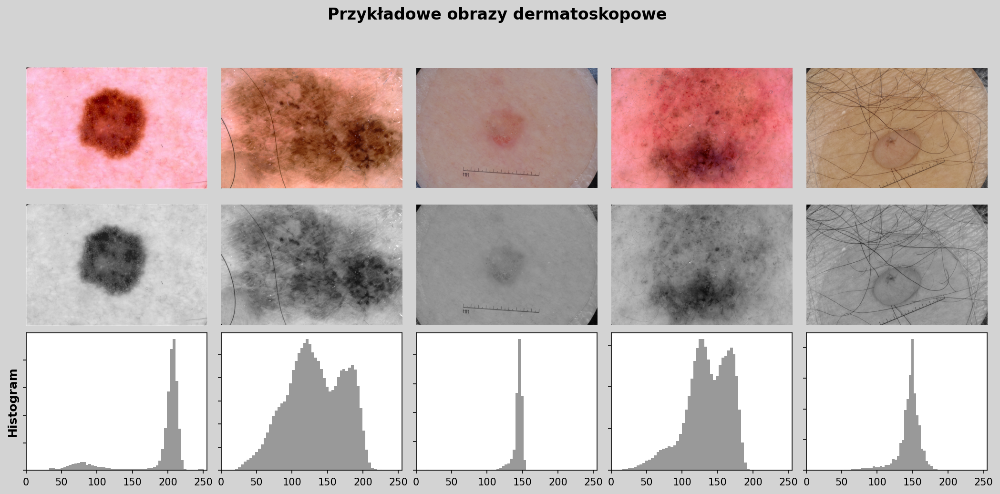

In [27]:
IMAGES_K = 5

np.random.seed(42)
indexes = np.random.choice(len(image_files), IMAGES_K, replace=False)

fig, axes = plt.subplots(3, IMAGES_K, figsize=(IMAGES_K * 2.8, 7), dpi=150)
fig.patch.set_facecolor('lightgray')
fig.suptitle("Przykładowe obrazy dermatoskopowe", fontsize=16, weight='bold')

for col, idx in enumerate(indexes):
    image_path = image_files[idx]
    image = cv2.imread(image_path)

    if image is None:
        print(f"Nie udało się wczytać obrazu: {image_path}")
        continue

    axes[0, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0, col].axis('off')
    if col == 0:
        axes[0, col].set_ylabel("Oryginał", fontsize=12, weight='bold')

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    axes[1, col].imshow(gray, cmap='gray')
    axes[1, col].axis('off')
    if col == 0:
        axes[1, col].set_ylabel("Skala szarości", fontsize=12, weight='bold')

    axes[2, col].hist(gray.ravel(), bins=64, color='gray', alpha=0.8)
    axes[2, col].set_xlim(0, 255)
    axes[2, col].set_ylim(0, None)
    axes[2, col].tick_params(axis='y', labelleft=False)
    if col == 0:
        axes[2, col].set_ylabel("Histogram", fontsize=12, weight='bold')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


Na podstawie powyższych histogramów widać że zdjęcia w skali szarości mają często bimodalne rozkłady. Algorytm Otsu jest dobrym punktem początkowym dla segmentacji semantycznej obrazów o takich właściwościach.

## Analiza metody progowania

Na początku skupimy się na segmentacji obrazów metodami progowania.

### Algorytm Otsu <span id="algorytm-otsu"></span>

Algorytm Otsu powinien dobrze radzić sobie z segmentacją zmian skórnych z uwagi na fakt że w większości zmiany te są ciemniejsze niż otaczająca je skóra. Analiza przykładowych obrazów ukazała że mają one rozkład dwumodalny co jest warunkiem do poprawnego działania algorytmu Otsu.

In [71]:
def otsu_segmentation(image): # Algorytm otsu
    if image.ndim == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU) # zmiany są zwykle ciemniejsze od skóry
    return mask

Wyniki metody: 0.4717


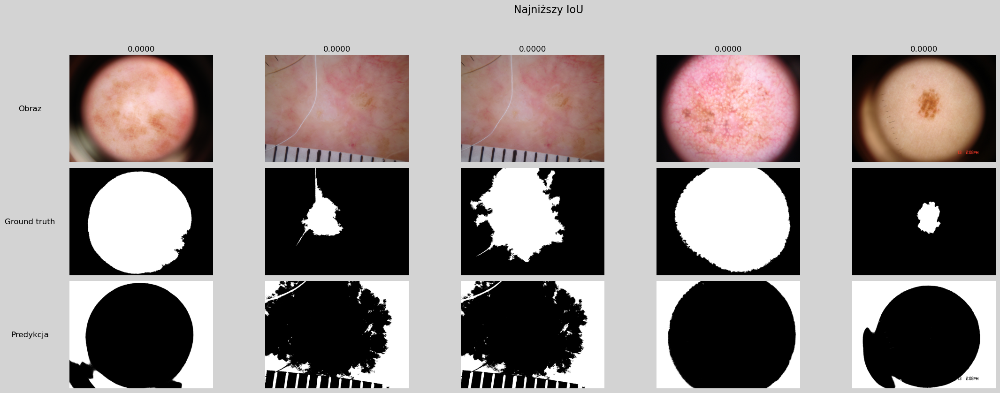

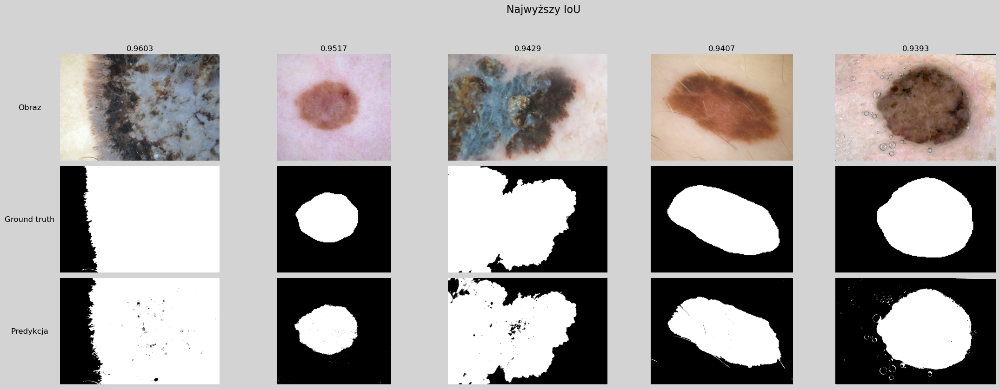

In [72]:
score = test_segmentation_method(otsu_segmentation, test_images_path, test_masks_path)
methods_scores['Otsu'] = score

Algorytm Otsu był bardzo wydajny. Dla wyraźnych obrazów dermatoskopowych uzyskał wysoki wynik IOU, problemem okazały się jednak obrazy z nierównym oświetleniem. Wiele zdjęć ma ciemniejsze brzegi najpewniej z uwagi na efekt uboczny przybliżenia. Widoczne są również anomalie na obrazach spowodowane lokalnymi skokami jasności obrazów wynikające z koloru zmian. Użycie filtrów powinno pomóc w eliminacji tych zanieczyszczeń

### Algorytm Otsu w połączeniu z filtrami <span id="algorytm-otsu-z-filtrami"></span>

W tej metodzie zastosowałem algorytm Ostu wraz z filtrami Gaussa, otwarcia i zamknięcia. Filtr gaussa nałożyłem przed segmentacją, natomiast filtry otwarcia i zamknięcia nałożyłem na maske w celu wygładzenia krawędzi oraz usunięcia szumu. Użyłem zbioru treningowego do określenia optymalnych wartości hiperparametrów filtrów.

In [73]:
def otsu_with_filters_segmentation(image, size=45, sigma = 1):
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    filtered_image = cv2.GaussianBlur(image, (0, 0), sigmaX=sigma, sigmaY=sigma)
    basic_otsu = otsu_segmentation(filtered_image)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (size, size))
    basic_otsu = cv2.morphologyEx(basic_otsu, cv2.MORPH_CLOSE, kernel)
    basic_otsu = cv2.morphologyEx(basic_otsu, cv2.MORPH_OPEN, kernel)
    return basic_otsu

In [74]:
params_grid = {'size' : [1, 3, 5, 7, 11, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65], 'sigma' : [0.5, 0.8, 1, 1.5, 2, 3, 4, 5, 6]}
best_params, best_score = save_or_load_best_hyperparameters('otsu_with_filters', otsu_with_filters_segmentation, train_images_path, train_masks_path, params_grid)
print(f'Best params: {best_params}, best score: {best_score:.4f}')

Evaluating otsu_with_filters: 100%|██████████| 144/144 [00:00<?, ?it/s]

Best params: {'size': 65, 'sigma': 6}, best score: 0.4688


Wyniki metody: 0.4895


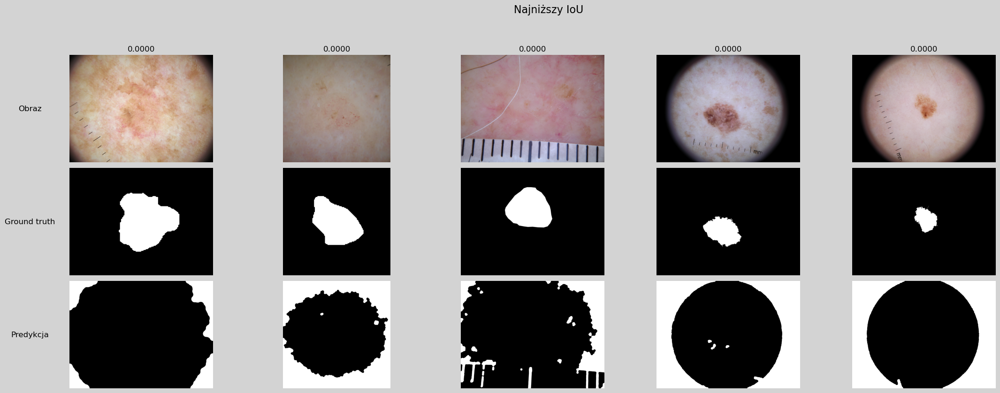

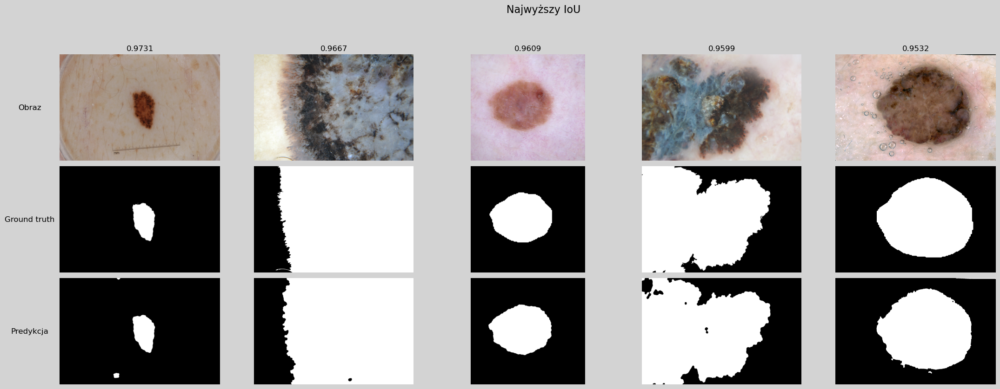

In [75]:
score = test_segmentation_method(otsu_with_filters_segmentation, test_images_path, test_masks_path, params=best_params)
methods_scores['Otsu with filters'] = score

Zastosowanie filtrów umożliwiło nieznaczne zwiększenie współczynnika IoU. Wzrost ten uzyskany jest kosztem znacznego zwiększenia obciążenia obliczeniowego, co znacząco ogranicza możliwość zastosowania tych filtrów.

### Progowanie lokalne <span id="progowanie-lokalne"></span>

Następną analizowaną metodą jest metoda progowania lokalnego. W przypadku poprzednich metod problemem była mniejsza jasność na brzegach obrazów. Metoda ta powinna lepiej poradzić sobie z tym problemem.

In [76]:
def local_threshold_segmentation(image, block_size=801, offset=0):
    if image.ndim == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    if block_size % 2 == 0:
        raise ValueError('Block size have to be odd')
    
    mask = cv2.adaptiveThreshold(
        image,
        maxValue=255,
        adaptiveMethod=cv2.ADAPTIVE_THRESH_MEAN_C,
        thresholdType=cv2.THRESH_BINARY_INV,
        blockSize=block_size,
        C=offset
    )
    return mask > 0

In [77]:
block_sizes=[11, 25, 55, 101, 201, 401, 801, 1001, 1201, 1401, 1601, 1801, 2001]
offsets=[-10, 0, 10]
grid_params = {'block_size' : block_sizes, 'offset' : offsets}
best_params, best_score = save_or_load_best_hyperparameters('local_threshold', local_threshold_segmentation, train_images_path, train_masks_path, grid_params)
print(f'Best params: {best_params}, best score: {best_score:.4f}')

Evaluating local_threshold: 100%|██████████| 39/39 [00:00<?, ?it/s]

Best params: {'block_size': 2001, 'offset': 10}, best score: 0.4067


Wyniki metody: 0.3644


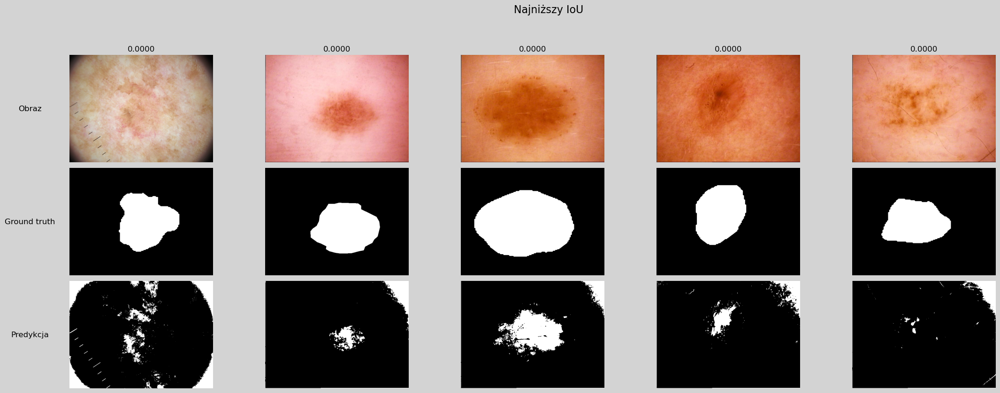

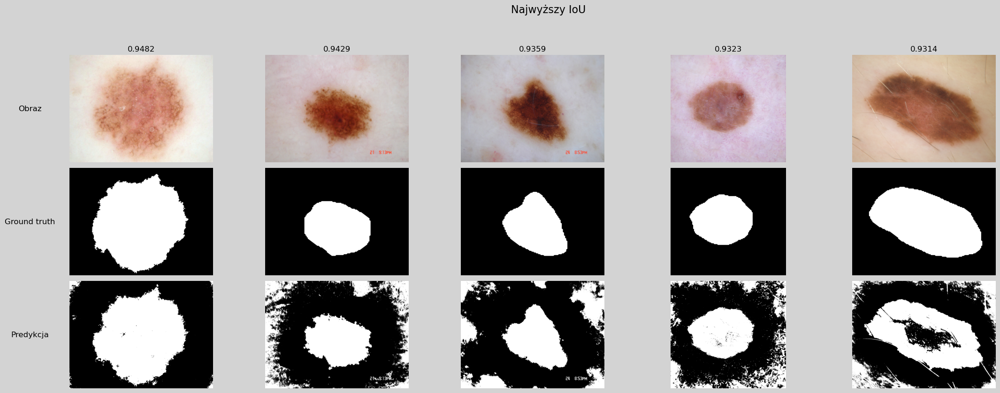

In [78]:
score = test_segmentation_method(local_threshold_segmentation, test_images_path, test_masks_path, params=best_params)
methods_scores['Local threshold'] = score

Progowanie lokalne działa gorzej w stosunku do algorytmu Otsu. Metoda ta osiąga wyższe wartości w przypadku wyższego współczynnika size dążąc do wielkości równej rozmiarom obrazów, czyli do metody progowania średniej. Nie poradziła sobie ona z zmianami jasności z uwagi na jej lokalny zakres działania. Zmiany są najczęsciej umieszczone w centrum obrazów oraz są jednolite co jest nieprawidłowo interpetowane przez tą metode. Podobnie jest z brzegami obrazów.

### Progowanie średniej <span id="progowanie-sredniej"></span>

In [79]:
def mean_threshold(image):
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    thresh = np.mean(image)

    mask = image < thresh
    return mask

Wyniki metody: 0.4151


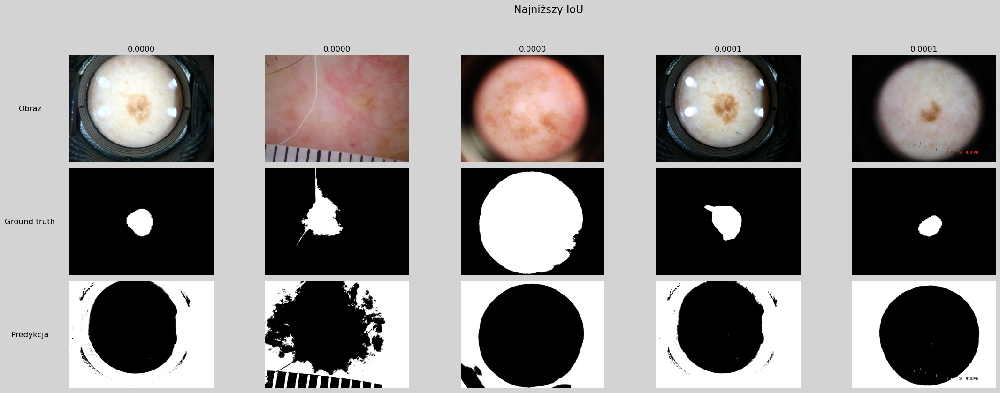

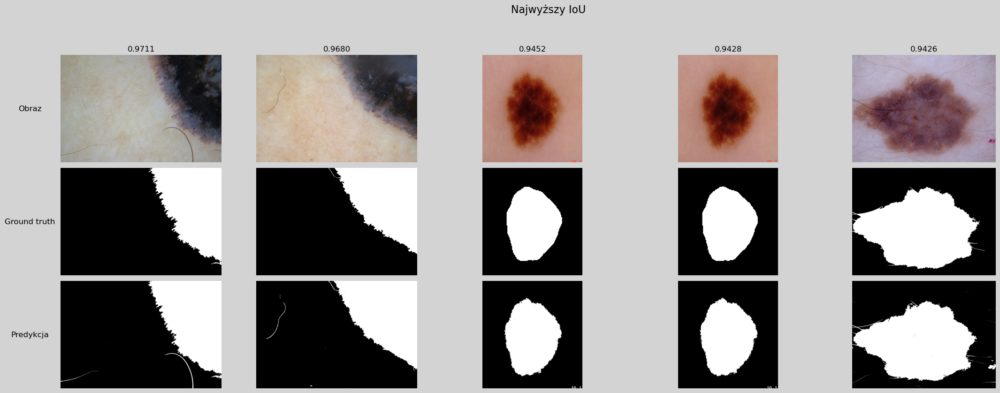

In [80]:
score = test_segmentation_method(mean_threshold, test_images_path, test_masks_path)
methods_scores['Mean threshold'] = score

Progowanie średniej jest nieznacznie szybsze od algorytmu Otsu, ale kosztem gorszego wyniku wskaźnika IoU.

### Podsumowanie metod progowych

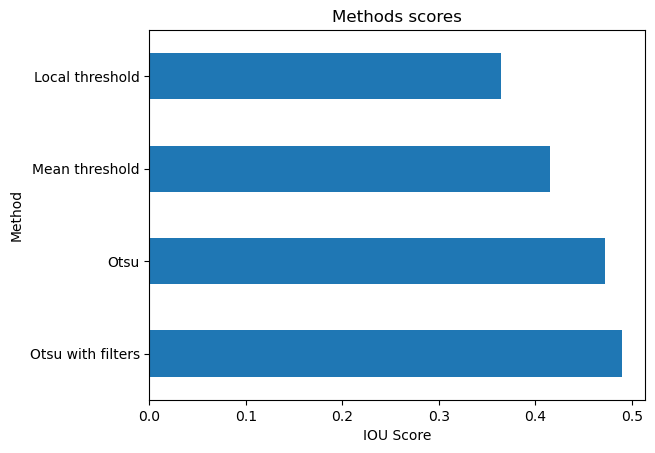

In [81]:
methods_scores.sort_values(ascending=False, inplace=True)

methods_scores.plot(kind='barh')
plt.ylabel('Method')
plt.xlabel('IOU Score')
plt.title('Methods scores');

Z wybranych metod progowych najefektywniejsza była metoda Otsu z filtrami, jednakże była ona bardzo wymagająca obliczeniowo. Z tego powodu sam algorytm Ostu był najlepszy ponieważ daje niewiele gorsze wyniki ale przy znacznie mniejszym obciążeniu obliczeniowym. Najmniej efektywna była metoda progowania lokalnego głównie przez charakterystyke tej metody.

## Analiza metody progowania z wykrywaniem obszaru krawędzi

W celu poprawy segmentacji przy pomocy progowania skupiłem się na problemie występowania czarnej obramówki mikroskopu w niektórych zdjęciach. Była ona widoczna na większości zdjęć z najmniejszym wskaźnikiem IoU. Jej występowanie sprawia że algorytmy progowania nieprawidłowo określają tą obramówke jako zmiane. W celu wykrycia czy maska znajduje się na obramówce sprawdzam czy wykryta maska znajduje się na krawędziach obrazu oraz sprawdzam średnią jasność maski. Jeżeli maska klasyfikuje się jako krawędź dermatoskopu to wypełniam piksele określone poprzez maske średnią wartością tła. Następnie ponownie przeprowadzam segmentacje.

In [86]:
def is_border_mask_dark(mask, image=None, threshold_ratio=0.8, brightness_thresh=50):
    # Funkcja służąca do określania czy wynik segmentacji jest obwódką obrazu
    h, w = mask.shape

    top = mask[0, :]
    bottom = mask[-1, :]
    left = mask[:, 0]
    right = mask[:, -1]

    top_weights = bottom_weights = np.concatenate([
        np.linspace(1, 0, w // 2),
        np.linspace(0, 1, w - w // 2)
    ])
    left_weights = right_weights = np.concatenate([
        np.linspace(1, 0, h // 2),
        np.linspace(0, 1, h - h // 2)
    ])

    top_vals = (top == 255).astype(float)
    bottom_vals = (bottom == 255).astype(float)
    left_vals = (left == 255).astype(float)
    right_vals = (right == 255).astype(float)

    top_score = np.sum(top_vals * top_weights)
    bottom_score = np.sum(bottom_vals * bottom_weights)
    left_score = np.sum(left_vals * left_weights)
    right_score = np.sum(right_vals * right_weights)

    max_top = np.sum(top_weights)
    max_bottom = np.sum(bottom_weights)
    max_left = np.sum(left_weights)
    max_right = np.sum(right_weights)

    weighted_ratio = (
        top_score / max_top +
        bottom_score / max_bottom +
        left_score / max_left +
        right_score / max_right
    ) / 4

    brightness_ok = True
    if image is not None:
        if len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        else:
            gray = image
        brightness = cv2.mean(gray, mask=(mask == 255).astype(np.uint8))[0]
        brightness_ok = brightness < brightness_thresh
    else:
        brightness = None

    return weighted_ratio > threshold_ratio and brightness_ok

def remove_border_mask(image, mask): # Funkcja wypełniająca obszar maski wartością średnią pikseli tła
    background_pixels = image[mask == 0]
    if background_pixels.size == 0:
        return image.copy()
    fill_value = int(np.mean(background_pixels))
    image_filled = image.copy()
    image_filled[mask > 0] = fill_value
    return image_filled

### Algorytm Otsu z detekcją krawędzi <span id="algorytm-otsu-z-detekcja-krawedzi"></span>

Na początku przetestowałem działanie klasycznego Otsu w połączeniu z detekcją maski na krawędzi.

In [87]:
def otsu_border_mask(image, threshold_ratio=0.8, brightness_thresh=50):
    mask = otsu_segmentation(image)

    if is_border_mask_dark(mask, threshold_ratio=threshold_ratio, brightness_thresh=brightness_thresh, image=image):
        image_without_border = remove_border_mask(image, mask)
        mask = otsu_segmentation(image_without_border)

    return mask

Wyniki metody: 0.4733


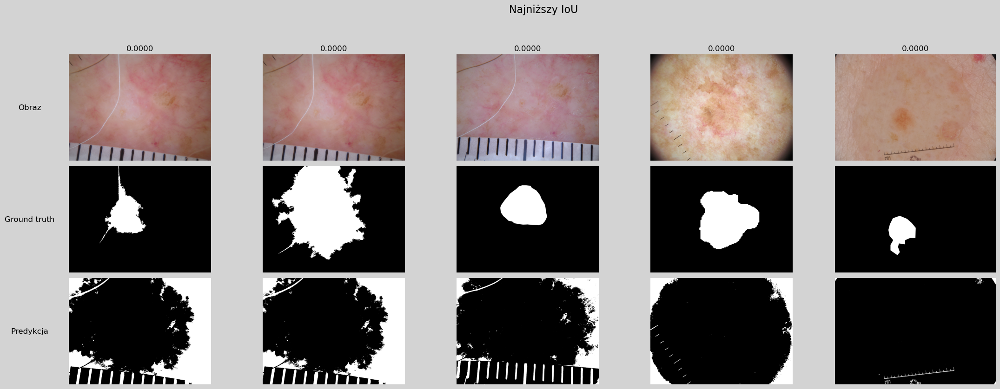

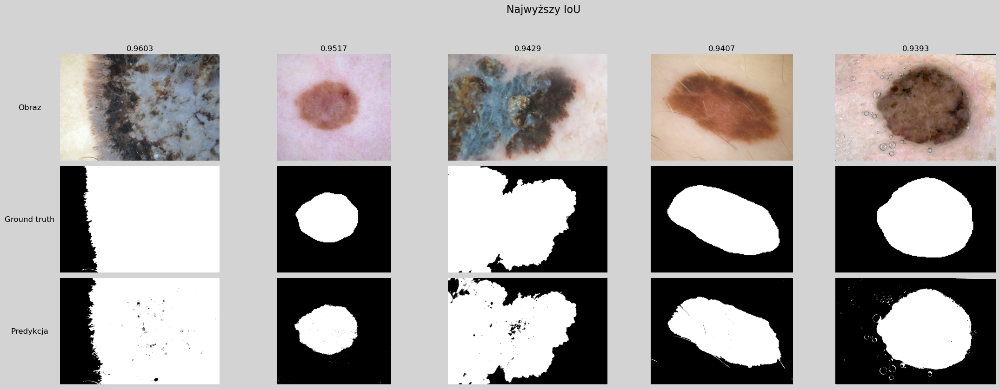

In [88]:
score = test_segmentation_method(otsu_border_mask, test_images_path, test_masks_path)
methods_border_detection_scores['Otsu'] = score
methods_scores['Otsu border detection'] = score

Wprowadzenie detekcji krawędzi nie poprawiło znacząco wyniku algorytmu Otsu. W przypadku 5 obrazów o najniższym IoU widoczne jest zmniejszenie liczby obrazów na których obramówka została wyznaczona jako maska.

### Algorytm Otsu w połączeniu z filtrami i z detekcją krawędzi <span id="algorytm-otsu-z-filtrami-i-z-detekcja-krawedzi"></span>

Kolejną metodą segmentacji którą chciałem przetestować w połączeniu z detekcją obramowania na krawędzi jest algorytm Otsu w połączeniu z filtrami. Wykorzystałem algorytm Otsu z hiperparametrami filtrów ustalonymi w poprzedniej sekcji.

In [89]:
params = get_best_hyperparameters('otsu_with_filters')

def otsu_with_filters_border_mask(image, threshold_ratio=0.8, brightness_thresh=50, size=45, sigma=1):
    mask = otsu_with_filters_segmentation(image, sigma=sigma, size=size)

    if is_border_mask_dark(mask, threshold_ratio=threshold_ratio, brightness_thresh=brightness_thresh, image=image):
        image_without_border = remove_border_mask(image, mask)
        mask = otsu_with_filters_segmentation(image_without_border)

    return mask

Wyniki metody: 0.4918


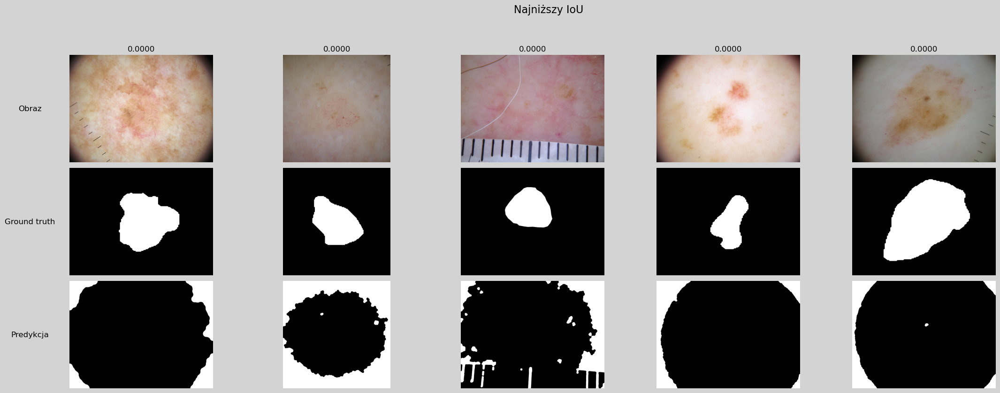

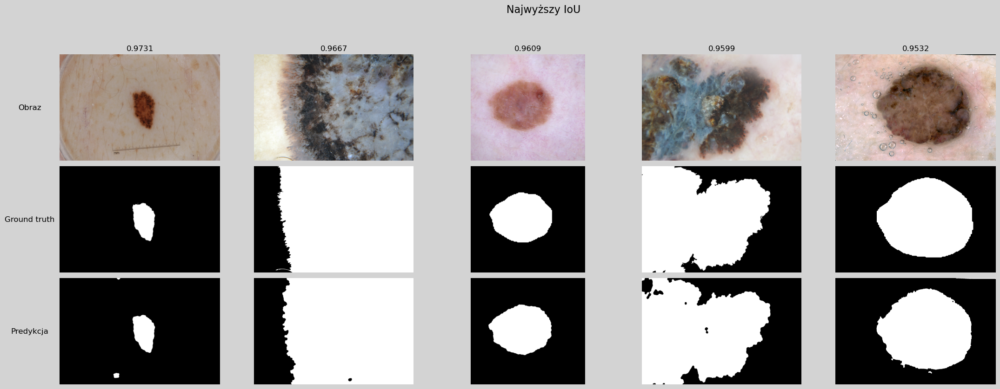

In [90]:
best_params = get_best_hyperparameters("otsu_with_filters")[0]

score = test_segmentation_method(otsu_with_filters_border_mask, test_images_path, test_masks_path, params=best_params)
methods_border_detection_scores['Otsu with filters'] = score
methods_scores['Otsu with filters border detection'] = score

Podobnie jak w standardowym Otsu detekcja krawędzi nie wpłyneła znacząco na wynik IoU.

### Progowanie średniej z z detekcją krawędzi <span id="progowanie-sredniej-z-detekcja-krawedzi"></span>

Ostatnią metodą segmentacji przez progowanie jaką przetestowałem z detekcją obramowania była metoda progowania średniej.

In [91]:
def mean_border_mask(image, threshold_ratio=0.8, brightness_thresh=50):
    mask = mean_threshold(image)

    if is_border_mask_dark(mask, threshold_ratio=threshold_ratio, brightness_thresh=brightness_thresh, image=image):
        image_without_border = remove_border_mask(image, mask)
        mask = mean_threshold(image_without_border)

    return mask

Wyniki metody: 0.4151


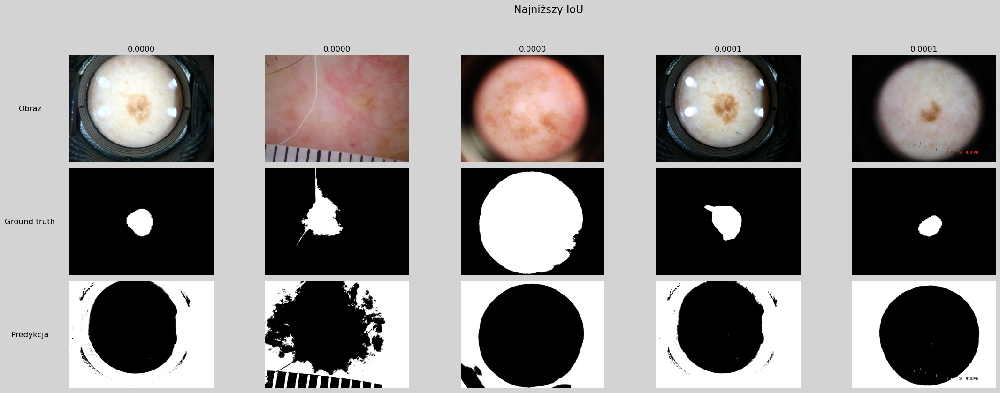

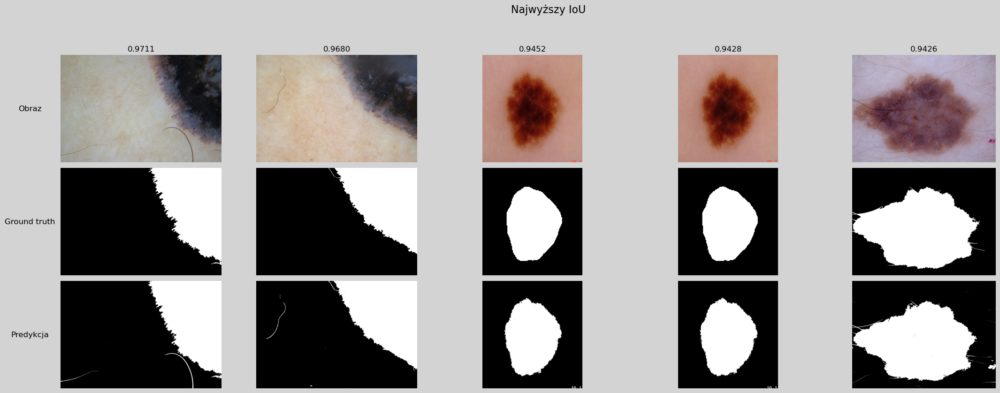

In [92]:
score = test_segmentation_method(mean_border_mask, test_images_path, test_masks_path)
methods_border_detection_scores['Mean threshold'] = score
methods_scores['Mean threshold border detection'] = score

Wprowadzenie detekcji obramowania dermatoskopu nie wpłyneło na wynik IoU w metodzie progowania średniej.

### Podsumowanie metod progowania z detekcją obramowania

Detekcja obramowania umożliwiła nieznaczne poprawienie wyniku IOU dla metod bazujących na algorytmie Otsu. W przypadku progowania przez średnią nie nastąpiła poprawa. Po dokładnym przyjrzeniu się zbiorowi zdjęć stwierdziłem że obramówka występuje w niewielkiej ich części, co sprawia że wykrywanie obramówki nie zwiększa znacząco średniej wartości IoU.

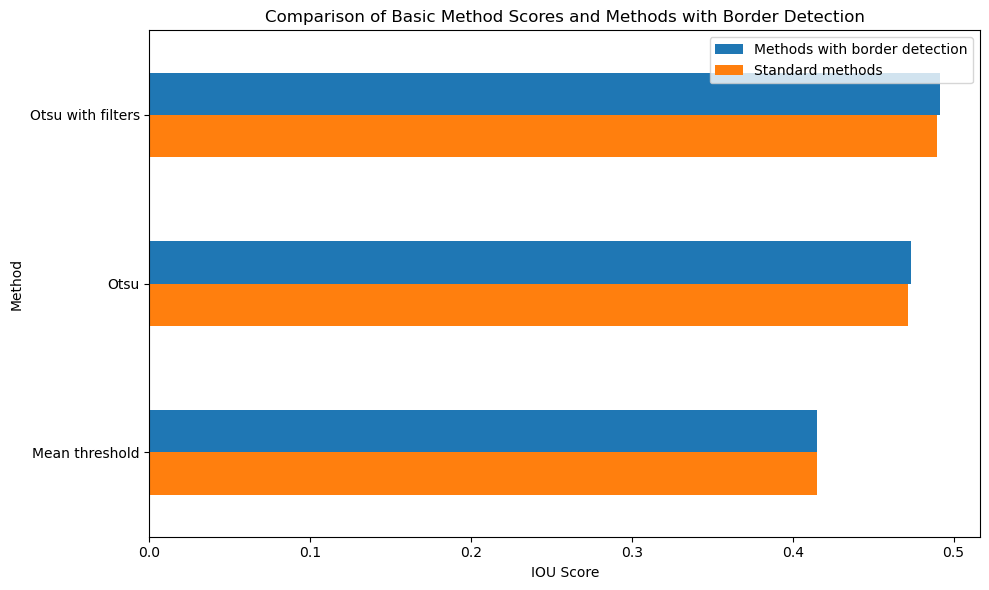

In [93]:
methods_border_detection_scores.sort_values(ascending=False, inplace=True)

aligned_scores = methods_scores[methods_border_detection_scores.index]

df = pd.DataFrame({
    'Methods with border detection': methods_border_detection_scores,
    'Standard methods': aligned_scores
})

df.plot(kind='barh', figsize=(10, 6))
plt.xlabel('IOU Score')
plt.ylabel('Method')
plt.title('Comparison of Basic Method Scores and Methods with Border Detection')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

## Segmentacja semantyczna przy pomocy uczenia głębokiego

### Przygotowanie zbioru danych

Podczas generowania zbioru danych użytego w uczeniu głębokim zastosowałem augmentacje zdjęć w celu zwiększenia ich wariacji.

In [47]:
class Augment(tf.keras.layers.Layer):
  def __init__(self, seed=42):
    super().__init__()
    self.flip_input = tf.keras.layers.RandomFlip("horizontal_and_vertical", seed=seed)
    self.flip_label = tf.keras.layers.RandomFlip("horizontal_and_vertical", seed=seed)
    self.rotate_input = tf.keras.layers.RandomRotation(0.1, seed=seed+1)
    self.rotate_label = tf.keras.layers.RandomRotation(0.1, seed=seed+1)
    self.random_brightness_input = tf.keras.layers.RandomBrightness(0.2, seed=seed+2)
    self.random_brightness_label = tf.keras.layers.RandomBrightness(0.2, seed=seed+2)
    self.random_contrast_input = tf.keras.layers.RandomContrast(0.2, seed=seed+3)
    self.random_contrast_label = tf.keras.layers.RandomContrast(0.2, seed=seed+3)

  def call(self, inputs, labels):
    inputs = self.flip_input(inputs)
    labels = self.flip_label(labels)
    inputs = self.rotate_input(inputs)
    labels = self.rotate_label(labels)
    inputs = self.random_brightness_input(inputs)
    labels = self.random_brightness_label(labels)
    inputs = self.random_contrast_input(inputs)
    labels = self.random_contrast_label(labels)
    return inputs, labels

def get_process_path(image_size):
  def process_path(image_path, mask_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(image, [image_size, image_size])
    image = tf.cast(image, tf.float32) / 255.0
    image = image[..., ::-1]

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, [image_size, image_size])
    mask = tf.cast(mask, tf.float32) / 255.0 

    return image, mask
  return process_path

def get_dataset(path_to_images, path_to_masks, batch_size=32, is_train=True, image_size=128):
  image_files = sorted([os.path.join(path_to_images, fname) for fname in os.listdir(path_to_images) if fname.lower().endswith(('.png', '.jpg'))])
  mask_files = sorted([os.path.join(path_to_masks, fname) for fname in os.listdir(path_to_masks) if fname.lower().endswith(('.png', '.jpg'))])

  dataset = tf.data.Dataset.from_tensor_slices((image_files, mask_files))
  dataset = dataset.map(get_process_path(image_size), num_parallel_calls=tf.data.AUTOTUNE).cache()

  if is_train:
    dataset = dataset.shuffle(buffer_size=len(image_files), seed=42)

  dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
  return dataset


In [48]:
IMAGE_SIZE_PERCEPTRON = 128

train_dataset = get_dataset(train_images_path, train_masks_path, batch_size=32, is_train=True, image_size=IMAGE_SIZE_PERCEPTRON)
validate_dataset = get_dataset(validate_images_path, validate_masks_path, batch_size=32, is_train=False, image_size=IMAGE_SIZE_PERCEPTRON)

In [49]:
@tf.function
def iou(y_true, y_pred, threshold=0.5, smooth=1e-6):
    y_pred_bin = tf.cast(y_pred > threshold, tf.float32)
    y_true_bin = tf.cast(y_true > 0.5, tf.float32)

    intersection = tf.reduce_sum(y_true_bin * y_pred_bin, axis=[1, 2])
    union = tf.reduce_sum(y_true_bin + y_pred_bin, axis=[1, 2]) - intersection

    iou_score = tf.reduce_mean((intersection + smooth) / (union + smooth), axis=0)
    return iou_score


### Perceptron wielowarstwowy <span id="perceptron"></span>

Przetestowalem podstawowy model uczenia glębokiego jakim jest perceptron wielowarstwowy. Obrazy użyte w treningu przeskalowalem aby pasowaly do warstwy wejściowej modelu. Podczas segmentacji przeskalowywuje obrazy testowe aby użyć ich do prefykcji a następnie przeskalowuje ich maskę żeby pasowała wymiarami.

In [50]:
tf.keras.backend.clear_session()
tf.random.set_seed(42)

inputs = tf.keras.Input(shape=(IMAGE_SIZE_PERCEPTRON, IMAGE_SIZE_PERCEPTRON, 3))
x = tf.keras.layers.Flatten()(inputs)
x = tf.keras.layers.Dense(64 * 64, activation='relu')(x)
x = tf.keras.layers.Dense(64 * 64, activation='relu')(x)
x = tf.keras.layers.Dense(IMAGE_SIZE_PERCEPTRON * IMAGE_SIZE_PERCEPTRON, activation='sigmoid')(x)
outputs = tf.keras.layers.Reshape((IMAGE_SIZE_PERCEPTRON, IMAGE_SIZE_PERCEPTRON, 1))(x)
model_perceptron = tf.keras.Model(inputs, outputs)

model_perceptron.compile(optimizer='adam', loss='binary_crossentropy', metrics=[iou])

In [51]:
model_perceptron.fit(
    train_dataset,
    validation_data=validate_dataset,
    epochs=30,
    batch_size=8,
    verbose=1
);

Epoch 1/30
82/82 [==============================] - 28s 34ms/step - loss: 0.3850 - iou: 0.3990 - val_loss: 0.4063 - val_iou: 0.4876
Epoch 2/30
82/82 [==============================] - 2s 25ms/step - loss: 0.3033 - iou: 0.4571 - val_loss: 0.4108 - val_iou: 0.4844
Epoch 3/30
82/82 [==============================] - 2s 26ms/step - loss: 0.2963 - iou: 0.4671 - val_loss: 0.4067 - val_iou: 0.3958
Epoch 4/30
82/82 [==============================] - 2s 25ms/step - loss: 0.2695 - iou: 0.4921 - val_loss: 0.3031 - val_iou: 0.5554
Epoch 5/30
82/82 [==============================] - 2s 25ms/step - loss: 0.2618 - iou: 0.4992 - val_loss: 0.3919 - val_iou: 0.5110
Epoch 6/30
82/82 [==============================] - 2s 25ms/step - loss: 0.2526 - iou: 0.5072 - val_loss: 0.3347 - val_iou: 0.5291
Epoch 7/30
82/82 [==============================] - 2s 24ms/step - loss: 0.2763 - iou: 0.4809 - val_loss: 0.3222 - val_iou: 0.5623
Epoch 8/30
82/82 [==============================] - 2s 25ms/step - loss: 0.2525 - 

In [52]:
def perceptron_segmentation(image):
    original_size = image.shape[:2]

    image_resized = cv2.resize(image, (IMAGE_SIZE_PERCEPTRON, IMAGE_SIZE_PERCEPTRON))

    image_resized = image_resized.astype(np.float32) / 255.0

    image_resized = np.expand_dims(image_resized, axis=0)

    prediction = model_perceptron.predict(image_resized, verbose=0)

    mask_resized = (prediction > 0.5).astype(np.uint8)

    mask = cv2.resize(mask_resized.squeeze(), (original_size[1], original_size[0]), interpolation=cv2.INTER_NEAREST)

    return mask

Wyniki metody: 0.6086


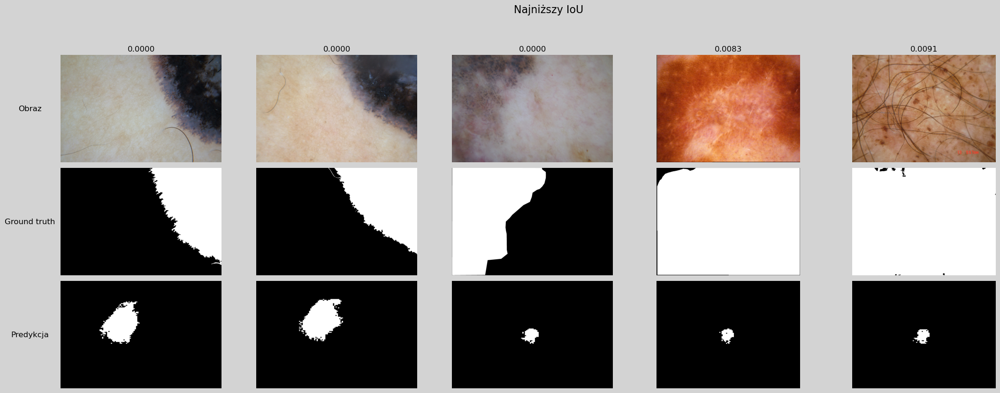

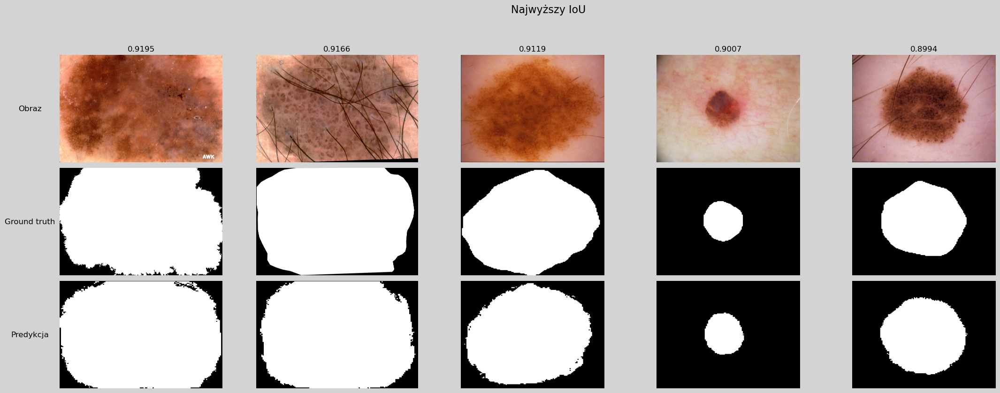

In [82]:
score = test_segmentation_method(
    perceptron_segmentation,
    test_images_path,
    test_masks_path,
)
methods_scores['Perceptron'] = score

Model uzyskał lepsze wyniki względem wszystkich metod progowania mimo tego że tracił część informacji w skutek skalowania. Nie ma też bezpośrednio informacji o ułożeniu pikseli ale był w stanie wyznaczyć piksele blisko siebie. Na podstawie przykładowych obrazów widać że model ma tendencje do wyznaczania maski w środku obrazu, oraz ma problem z określeniem maski jeżeli zmiana jest przesunięta na obrazie. Zastosowanie warstw splotowych powinno poprawić wyniki.

### Sieć U-Net <span id="unet"></span>

Kolejną siecią neuronową jaką przetestowałem jest sieć U-Net. Jest ona stworzona między innymi do segmentacji semantycznej dlatego powinna uzyskać lepsze wyniki od prostego MLP. Wykorzystałem również uczenie transferowe w celu zwiększenia dokładności. Jako enkoder wykorzystałem wytrenowane warstwy modelu [MobileNetV2](https://paperswithcode.com/method/mobilenetv2). Jako dekoder użyłem transponowanej warstwy konwolucyjnej. Skorzystałem z artykułu na stronie [tensorflow](https://www.tensorflow.org/tutorials/images/segmentation?hl=pl). Podobnie jak w MLP przeskalowywałem obrazy żeby pasowały do wejścia modelu.

In [54]:
train_dataset = get_dataset(train_images_path, train_masks_path, batch_size=32, is_train=True, image_size=224)
validate_dataset = get_dataset(validate_images_path, validate_masks_path, batch_size=32, is_train=False, image_size=224)

In [55]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[224, 224, 3], include_top=False)

layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

def upsample(filters, size):
    return tf.keras.Sequential([
        tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.ReLU()
    ])

up_stack = [
    upsample(512, 3),  # 4x4 -> 8x8
    upsample(256, 3),  # 8x8 -> 16x16
    upsample(128, 3),  # 16x16 -> 32x32
    upsample(64, 3),   # 32x32 -> 64x64
]

def unet_model():
  inputs = tf.keras.layers.Input(shape=[224, 224, 3])

  skips = down_stack(inputs)
  x = skips[-1]
  skips = reversed(skips[:-1])

  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  last = tf.keras.layers.Conv2DTranspose(
      filters=1, kernel_size=3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)


In [56]:
model_unet = unet_model()
model_unet.compile(optimizer='adam',
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=[iou])


In [57]:
EPOCHS = 10
model_history = model_unet.fit(train_dataset, epochs=EPOCHS,
                          validation_data=validate_dataset)


Epoch 1/10
82/82 [==============================] - 31s 64ms/step - loss: 0.2998 - iou: 0.4365 - val_loss: 0.3171 - val_iou: 0.6382
Epoch 2/10
82/82 [==============================] - 4s 51ms/step - loss: 0.1817 - iou: 0.6794 - val_loss: 0.2208 - val_iou: 0.7326
Epoch 3/10
82/82 [==============================] - 4s 50ms/step - loss: 0.1734 - iou: 0.6969 - val_loss: 0.2742 - val_iou: 0.6691
Epoch 4/10
82/82 [==============================] - 4s 50ms/step - loss: 0.1697 - iou: 0.6982 - val_loss: 0.2371 - val_iou: 0.7027
Epoch 5/10
82/82 [==============================] - 4s 50ms/step - loss: 0.1640 - iou: 0.7083 - val_loss: 0.2256 - val_iou: 0.7213
Epoch 6/10
82/82 [==============================] - 4s 50ms/step - loss: 0.1668 - iou: 0.7031 - val_loss: 0.2064 - val_iou: 0.7515
Epoch 7/10
82/82 [==============================] - 4s 51ms/step - loss: 0.1601 - iou: 0.7127 - val_loss: 0.2068 - val_iou: 0.7496
Epoch 8/10
82/82 [==============================] - 4s 50ms/step - loss: 0.1548 - 

In [58]:
IMAGE_SIZE_UNET = 224

def unet_segmentation(image):
    original_size = image.shape[:2]

    image_resized = cv2.resize(image, (IMAGE_SIZE_UNET, IMAGE_SIZE_UNET))

    image_resized = image_resized.astype(np.float32) / 255.0

    image_resized = np.expand_dims(image_resized, axis=0)

    prediction = model_unet.predict(image_resized, verbose=0)

    mask_resized = (prediction > 0.5).astype(np.uint8)

    mask = cv2.resize(mask_resized.squeeze(), (original_size[1], original_size[0]), interpolation=cv2.INTER_NEAREST)

    return mask


Wyniki metody: 0.7354


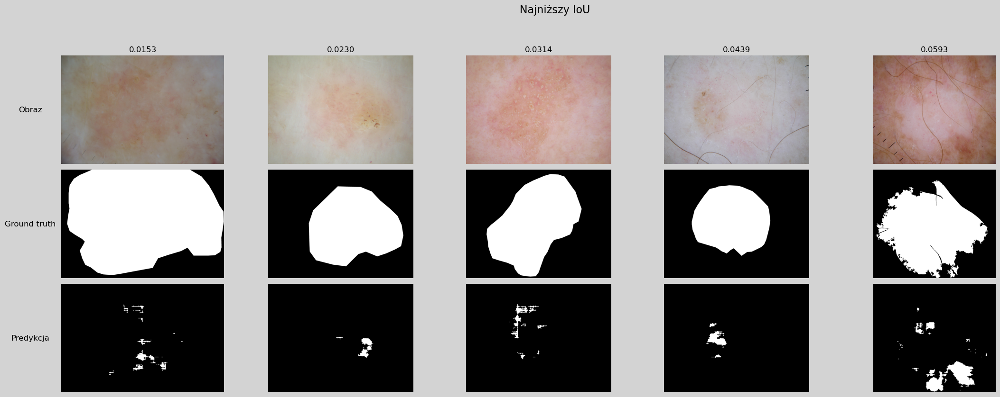

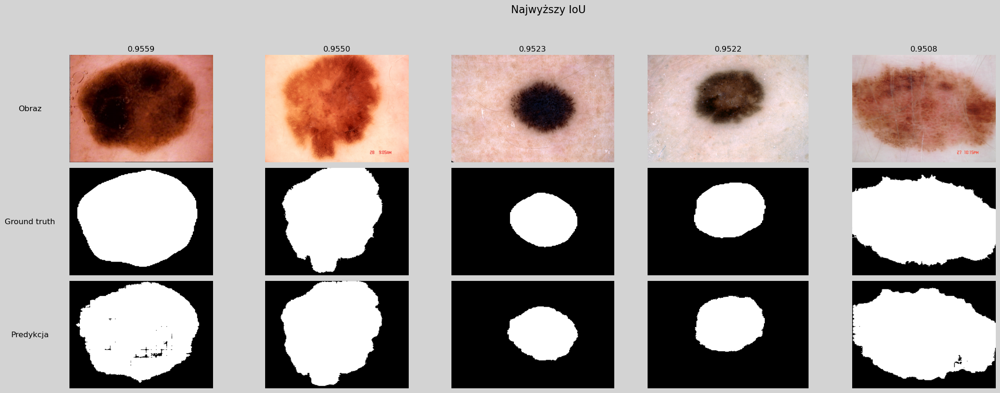

In [83]:
score = test_segmentation_method(
    unet_segmentation,
    test_images_path,
    test_masks_path,
)
methods_scores['U-Net'] = score

Sieć U-Net uzyskała najlepsze wyniki ze wszystkich analizowanych metod. Artefakty takie jak godzina wykonania zdjęcia albo linijka były ignorowane przez sieć, co było problemem w innych metodach. Sieć miała problemy z segmentacją obrazów na których zmiana jest ledwo widoczna. Generowało to maski z dużą ilością szumu. Podobny problem był spotykany w innych metodach. Wykorzystanie uczenia transferowego umożliwiło nauczenie sieci przy niedużej ilości danych uczących w mniejszej ilości epok.

## Podsumowanie

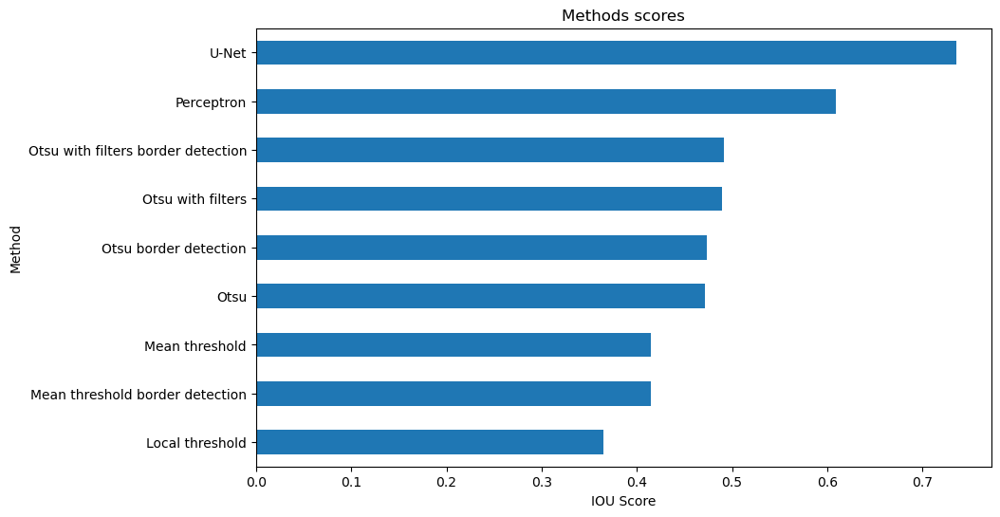

In [95]:
methods_scores.sort_values(ascending=True, inplace=True)

plt.figure(figsize=(10, 6))

methods_scores.plot(kind='barh')
plt.ylabel('Method')
plt.xlabel('IOU Score')
plt.title('Methods scores');

Po analizie wybranych metod segmentacji semantycznej doszedłem do następujących wniosków:
- Sieć U-Net najlepiej nadaje się do segmentacji obrazów dermatoskopowych. Uzyskała najlepszy wynik IoU, była odporna na artefakty i stosunkowo szybka.
- Perceptron uzyskał nieco lepsze wyniki od metod progowania, jednakże nie jest on opracowany z myślą o segmentacji przez co jest niestabilny. Radził sobie głównie ze zmianami znajdującymi się na środku co ogranicza jego zastosowania.
- Oba warianty otsu z filtrami uzyskały najlepsze wyniki wśród metod progowania. Metoda ta była jednak dużo wolniejsza względem reszty metod. Proces wyznaczania prawidłowych hiperparametrów również trwał dużo dłuzej niż uczenie innych metod.
- Standardowy algorytm Otsu był szybki, nie wymagał wyznaczenia hiperparametrów oraz uzyskał tylko niewiele gorsze wyniki niż jego odpowiednik z filtrami. Jest dobrym kompromisem między wydajnością i wynikami.
- Metoda progowania przez średnią oraz progowanie lokalne uzyskały najgorsze wyniki wśród wszystkich analizowanych metod. Nie powinny być stosowane do segmentacji obrazów dermatoskopowych. Metoda progowania lokalnego jest szczególnie nie odpowiednia ponieważ uzyskała najgorsze wyniki i jednocześnie była dużo wolniejsza niż przykładowo Otsu.

Segmentacja obrazów dermatoskopowych jest ważnym krokiem podczas komputerowej analizy zmiany dlatego najlepszym wyborem jest sieć U-Net. Nie wymaga ona dużej ilości danych uczących dzięki zastosowaniu uczeniu transferowemu, a uzyskuje znacznie lepsze wyniki. W przypadku braku danych uczących wykorzystałbym algorytm Otsu bądź jego wariant z filtrami.

## Wyniki segmentacji metod dla przykładowych zdjęć zdjęcia

Wykonałem segmentacje semantyczną na 2 przykładowych obrazach korzystając z testowanych metod w celu zobrazowania ich wyników.

In [61]:
methods_list = [
    (otsu_segmentation, None),
    (otsu_with_filters_segmentation, get_best_hyperparameters('otsu_with_filters')[0]),
    (local_threshold_segmentation, get_best_hyperparameters('local_threshold')[0]),
    (mean_threshold, None),
    (otsu_border_mask, None),
    (otsu_with_filters_border_mask, get_best_hyperparameters('otsu_with_filters')[0]),
    (mean_border_mask, None),
    (perceptron_segmentation, None),
    (unet_segmentation, None)
]

In [62]:
def compare_methods(img, ground_truth, methods_list, rows=5):
    # Funkcja porównująca różne metody segmentacji na wybranych obrazach
    results = []

    for method, params in methods_list:
        mask = method(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), **params) if params else method(img)
        results.append((method.__name__, mask))

    num_methods = len(results)
    num_rows = 1 + (num_methods + rows - 1) // rows 

    fig, axes = plt.subplots(num_rows, rows, figsize=(4 * rows, 4 * num_rows))
    axes = axes.flatten()

    axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cmap='gray')
    axes[0].set_title('Image')
    axes[0].axis('off')

    axes[1].imshow(ground_truth, cmap='gray')
    axes[1].set_title('Ground Truth')
    axes[1].axis('off')

    for i in range(2, len(axes)):
        axes[i].axis('off')
    
    for i, (name, mask) in enumerate(results):
        ax_idx = i + 5  
        if ax_idx >= len(axes):
            break
        axes[ax_idx].imshow(mask, cmap='gray')
        axes[ax_idx].set_title(name)
        axes[ax_idx].axis('off')

    for i in range(len(results) + 2, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

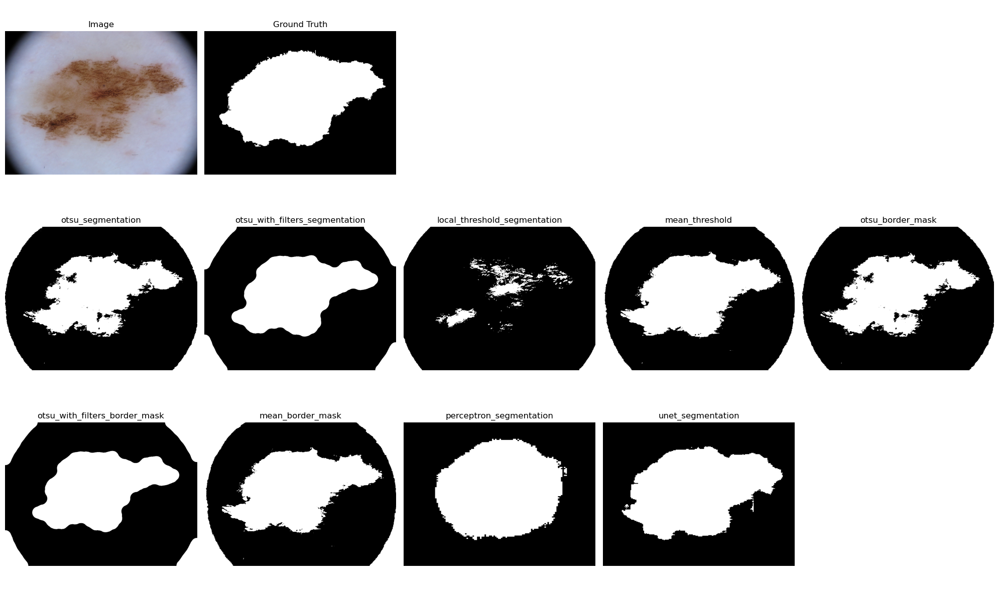

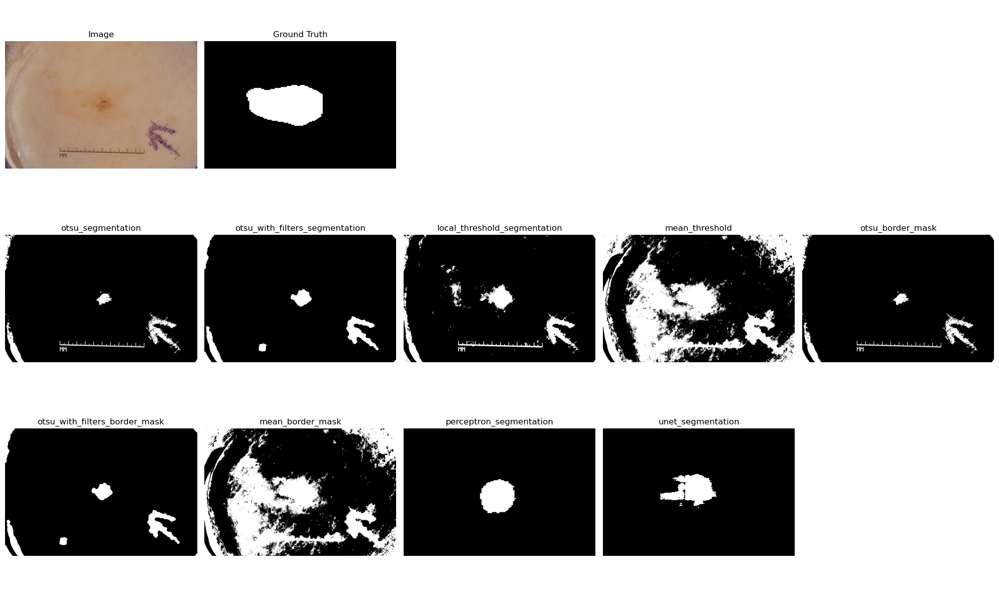

In [63]:
IMAGES_K = 2
np.random.seed(45)

train_images = set_up_images(train_images_path)
train_masks = set_up_images(train_masks_path)

indexes = np.random.choice(len(train_images), IMAGES_K, replace=False)

images_selected = [train_images[idx] for idx in indexes]
masks_selected = [train_masks[idx] for idx in indexes]

for i in range(len(images_selected)):
    image_selected = get_image(images_selected[i])
    mask_selected = get_image(masks_selected[i], is_grayscale=True)
    compare_methods(image_selected, mask_selected, methods_list)

Na powyższym przykładzie widać że sieć U-Net poradziła sobie najlepiej z zadaniem segmentacji nawet w warunkach złego oświetlenia i występowania artefaktów na brzegu obrazu.